# Aitana Bonmati and The Golden Ball at World Cup '23

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/6/6b/Brann_-_Bar%C3%A7a_Femen%C3%AD_CG3A5805_%28cropped%29.jpg/500px-Brann_-_Bar%C3%A7a_Femen%C3%AD_CG3A5805_%28cropped%29.jpg" width="180" height="210">

In [5]:
# Installing libraries
! pip install mplsoccer --quiet
! pip install statsbombpy --quiet
! pip install networkx --quiet

In [6]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict, Counter
from mplsoccer import Pitch, VerticalPitch
import plotly.graph_objects as go
from statsbombpy import sb
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import networkx as nx
from collections import Counter

## Loading World Cup Data

In [7]:
free_comps = sb.competitions()

In [8]:
free_comps.competition_name.unique()

array(['1. Bundesliga', 'African Cup of Nations', 'Champions League',
       'Copa America', 'Copa del Rey', "FA Women's Super League",
       'FIFA U20 World Cup', 'FIFA World Cup', 'Indian Super league',
       'La Liga', 'Liga Profesional', 'Ligue 1', 'Major League Soccer',
       'North American League', 'NWSL', 'Premier League', 'Serie A',
       'UEFA Euro', 'UEFA Europa League', "UEFA Women's Euro",
       "Women's World Cup"], dtype=object)

In [9]:
free_comps[(free_comps['competition_name']=="Women's World Cup") & (free_comps['season_name'] == '2023')]

,competition_id,season_id,country_name,competition_name,competition_gender,competition_youth,competition_international,season_name,match_updated,match_updated_360,match_available_360,match_available
73,72,107,International,Women's World Cup,female,False,True,2023,2025-07-14T10:07:06.620906,2025-07-14T10:10:27.224586,2025-07-14T10:10:27.224586,2025-07-14T10:07:06.620906


The `competition_id = 72` and the `season_id = 107`

In [10]:
# Getting all the matches from the 23 Women's World Cup
matches = sb.matches(competition_id=72, season_id=107)

In [11]:
matches.head(3)

,match_id,match_date,kick_off,competition,season,home_team,away_team,home_score,away_score,match_status,...,last_updated_360,match_week,competition_stage,stadium,referee,home_managers,away_managers,data_version,shot_fidelity_version,xy_fidelity_version
0,3904629,2023-08-16,13:00:00.000,International - Women's World Cup,2023,Australia Women's,England Women's,1,3,available,...,2023-08-30T11:17:47.551826,6,Semi-finals,Accor Stadium,Tori Penso,Tony Gustavsson,Sarina Glotzbach-Wiegman,1.1.0,2,2
1,3906390,2023-08-20,13:00:00.000,International - Women's World Cup,2023,Spain Women's,England Women's,1,0,available,...,2023-08-22T19:38:43.965521,7,Final,Accor Stadium,Tori Penso,Jorge Vilda,Sarina Glotzbach-Wiegman,1.1.0,2,2
2,3906389,2023-08-19,11:00:00.000,International - Women's World Cup,2023,Sweden Women's,Australia Women's,2,0,available,...,2023-08-29T21:19:57.035390,7,3rd Place Final,Brisbane Stadium,Cheryl Foster,Peter Gerhardsson,Tony Gustavsson,1.1.0,2,2


Filtering Spain's Matches

In [ ]:
spain_matches = matches[(matches['home_team'] == "Spain Women's") | (matches['away_team'] == "Spain Women's")]

In [13]:
# Extracting Event Data for Spain's matches
all_events = []

for match_id in spain_matches['match_id']:
  events = sb.events(match_id=match_id).reset_index(drop=True)
  all_events.append(events)  # appending all spain events to empty list

spain_df = pd.concat(all_events).reset_index(drop = True)

In [14]:
# Filtering Aitana Bonmati's event data
aitana_df = spain_df[spain_df['player'] == 'Aitana Bonmati Conca']

## 1. Midfield Control and Involvement

#### Touch Heatmap to Understand Zone Influence

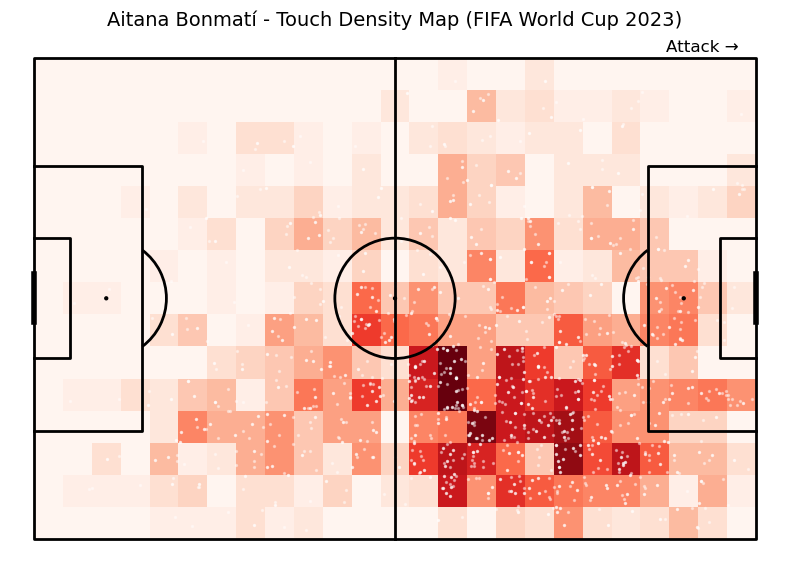

In [15]:
from mplsoccer import Pitch
import numpy as np

# Create pitch
pitch = Pitch(pitch_type='statsbomb', pitch_color='white', line_color='black', line_zorder=2)
fig, ax = pitch.draw(figsize=(8, 6))

# Extract touch coordinates
x = aitana_df['location'].dropna().apply(lambda x: x[0])
y = aitana_df['location'].dropna().apply(lambda x: x[1])

# Bin the data into 30x20 grid
bin_stat = pitch.bin_statistic(x, y, statistic='count', bins=(25, 15), normalize=False)

# Plot the heatmap
pitch.heatmap(bin_stat, ax=ax, cmap='Reds')
pitch.scatter(x, y, ax=ax, color='white', s=2, alpha=0.4)  # optional scatter overlay

# Add direction of attack arrow
ax.text(105, -1, 'Attack →', color='black', fontsize=12)

# Title
ax.set_title('Aitana Bonmatí - Touch Density Map (FIFA World Cup 2023)', fontsize=14)
plt.show()


In [16]:
# Calculate pitch third for each touch
def get_third(x):
    if x < 40:
        return 'Defensive Third'
    elif x < 80:
        return 'Middle Third'
    else:
        return 'Final Third'

# Filter valid touch events with location
touch_locs = aitana_df[aitana_df['location'].notna()]

# Assign thirds
touch_locs['third'] = touch_locs['location'].apply(lambda loc: get_third(loc[0]))

# Count and print percentage
touch_counts = touch_locs['third'].value_counts(normalize=True) * 100
print("Touches by Third (as %):\n", touch_counts.round(2))

Touches by Third (as %):
 third
Final Third        45.59
Middle Third       45.04
Defensive Third     9.38
Name: proportion, dtype: float64


/var/folders/bl/dm6xfp0n2tndy27vk0xjd6jm0000gn/T/ipykernel_1544/259905906.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  touch_locs['third'] = touch_locs['location'].apply(lambda loc: get_third(loc[0]))


#### Pass Network Map

In [17]:
# Filter completed passes
passes = spain_df[(spain_df['type'] == 'Pass') & (spain_df['pass_outcome'].isna())]

# Filter passes involving Aitana
bonmati_passes = passes[(passes['player'] == 'Aitana Bonmati Conca') | (passes['pass_recipient'] == 'Aitana Bonmati Conca')]

In [18]:
# Group by passer-recipient pairs
edges = bonmati_passes.groupby(['player', 'pass_recipient']).agg({
    'id': 'count',
    'location': lambda x: np.mean([i[0] for i in x.dropna()]),
    'pass_end_location': lambda x: np.mean([i[0] for i in x.dropna()])
}).rename(columns={'id': 'pass_count'}).reset_index()

# Filter out self-passes and missing names
edges = edges[(edges['player'].notna()) & (edges['pass_recipient'].notna())]
edges = edges[edges['player'] != edges['pass_recipient']]

In [19]:
# Build graph
G = nx.DiGraph()
for _, row in edges.iterrows():
    G.add_edge(row['player'], row['pass_recipient'], weight=row['pass_count'])

# Compute average position per player
player_locs = {}

for name in pd.concat([bonmati_passes['player'], bonmati_passes['pass_recipient']]).dropna().unique():
    player_events = bonmati_passes[
        (bonmati_passes['player'] == name) | (bonmati_passes['pass_recipient'] == name)
    ]
    x_vals, y_vals = [], []

    for _, row in player_events.iterrows():
        if row['player'] == name and isinstance(row['location'], list):
            x_vals.append(row['location'][0])
            y_vals.append(row['location'][1])
        elif row['pass_recipient'] == name and isinstance(row['pass_end_location'], list):
            x_vals.append(row['pass_end_location'][0])
            y_vals.append(row['pass_end_location'][1])

    if x_vals and y_vals:
        player_locs[name] = (np.mean(x_vals), np.mean(y_vals))

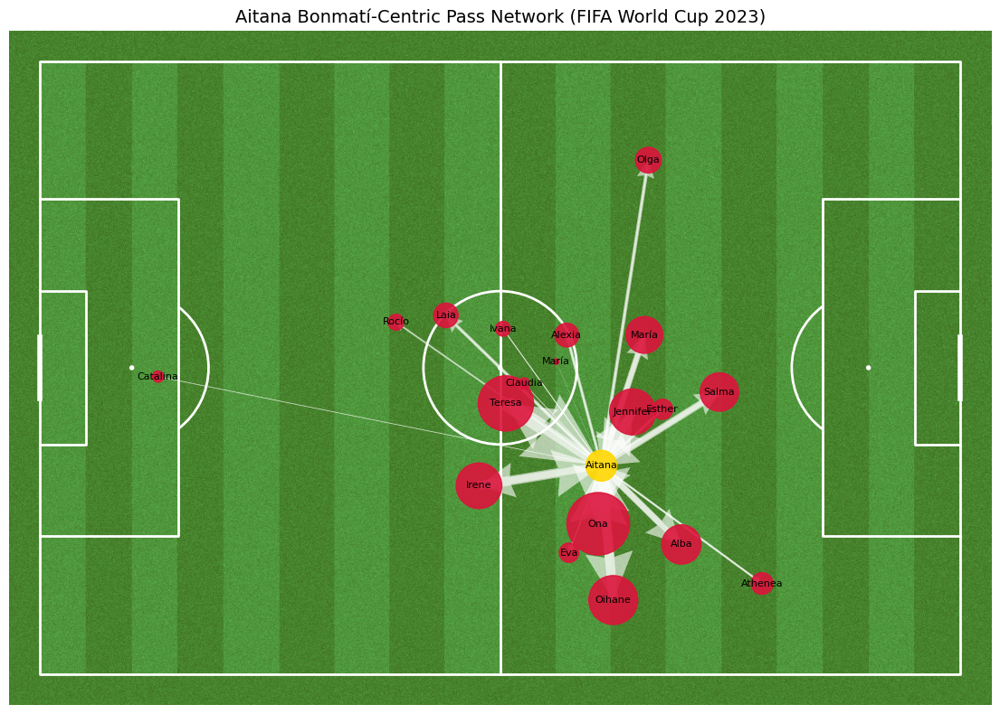

In [20]:
# Draw pitch
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)
fig, ax = pitch.draw(figsize=(16, 8))

# Draw edges (arrow width = passes received)
for u, v, d in G.edges(data=True):
    if u in player_locs and v in player_locs:
        width = d['weight'] * 0.2  # Adjust width scale here
        pitch.arrows(player_locs[u][0], player_locs[u][1],
                     player_locs[v][0], player_locs[v][1],
                     ax=ax, width=width, headwidth=5,
                     color='white', alpha=0.6, zorder=1)

# Draw nodes (Bonmatí fixed size & gold, others dynamic & crimson)
node_sizes = []
node_colors = []

for node in G.nodes:
    if node == 'Aitana Bonmati Conca':
        node_sizes.append(600)
        node_colors.append('gold')
    else:
        total_passes = sum([d['weight'] for u, v, d in G.edges(data=True) if u == node or v == node])
        node_sizes.append(total_passes * 20)
        node_colors.append('crimson')

nx.draw_networkx_nodes(G, player_locs, node_size=node_sizes, node_color=node_colors, ax=ax, alpha=0.9)

# Add player names
for player, (x, y) in player_locs.items():
    ax.text(x, y, player.split()[0], fontsize=8, color='black', ha='center', va='center')

# Title
ax.set_title("Aitana Bonmatí-Centric Pass Network (FIFA World Cup 2023)", fontsize=14, color='black')
plt.show()


In [21]:
# Degree Centrality
degree_centrality = nx.degree_centrality(G)

# Betweenness Centrality
betweenness_centrality = nx.betweenness_centrality(G, weight='weight')

# Closeness Centrality
closeness_centrality = nx.closeness_centrality(G)

# Display Bonmatí's centrality scores
bonmati_key = 'Aitana Bonmati Conca'

print("Aitana Bonmatí Centrality Scores:")
print(f"  Degree:      {degree_centrality.get(bonmati_key, 0):.3f}")
print(f"  Betweenness: {betweenness_centrality.get(bonmati_key, 0):.3f}")
print(f"  Closeness:   {closeness_centrality.get(bonmati_key, 0):.3f}")


Aitana Bonmatí Centrality Scores:
  Degree:      1.947
  Betweenness: 0.947
  Closeness:   0.947


**Degree Centrality: 1.947**
- This value represents the total number of direct connections (as both passer and receiver) Aitana had with her teammates, normalized by the maximum possible in the network.

- A score above 1.0 indicates she was directly involved in passes with almost every player, multiple times, showcasing her role as a central distribution hub.

**Betweenness Centrality: 0.947**
- This measures how often Aitana served as a bridge between other players — i.e., how crucial she was in connecting different parts of the team.

- A high score (close to 1.0) shows that many of Spain’s pass sequences relied on Bonmatí, making her indispensable in maintaining possession flow.

**Closeness Centrality: 0.947**
- Closeness reflects how quickly a player can interact with others in the network, the inverse of total distance to all other players.

- This high value shows Aitana could quickly influence the game from nearly any position, always being in reach for her teammates.

**Conclusion:**

These centrality scores reinforce that Aitana Bonmatí was not only a frequent passer and receiver but also the strategic connector in Spain's buildup play, fully justifying her role as the midfield orchestrator during the FIFA Women’s World Cup 2023.

#### Progressive Actions Flow Map

In [22]:
# Progressive Pass or Carry: movement of at least 10m toward goal and ends in final 60% of pitch
def is_progressive(start, end):
    return (end[0] - start[0]) >= 10 and end[0] >= 60

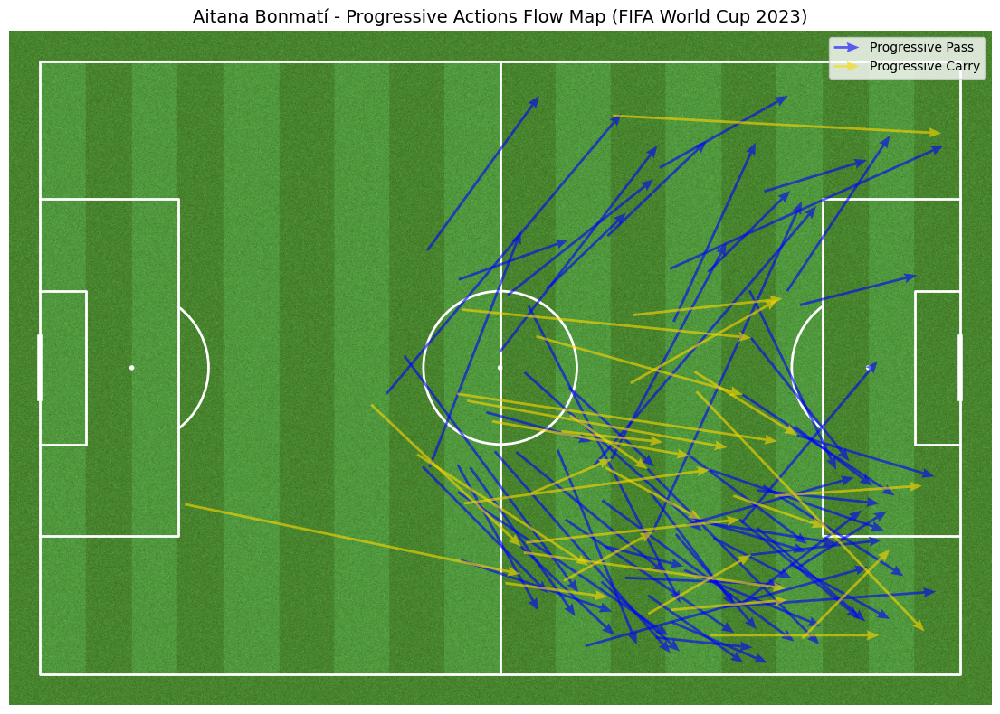

In [23]:
# Filter passes and carries
passes = aitana_df[(aitana_df['type'] == 'Pass') & (aitana_df['pass_outcome'].isna())]
carries = aitana_df[aitana_df['type'] == 'Carry']

# Filter progressive ones
def is_progressive(start, end):
    return isinstance(start, list) and isinstance(end, list) and (end[0] - start[0]) >= 10 and end[0] >= 60

progressive_passes = passes[passes.apply(lambda row: is_progressive(row['location'], row['pass_end_location']), axis=1)]
progressive_carries = carries[carries.apply(lambda row: is_progressive(row['location'], row['carry_end_location']), axis=1)]

# Setup pitch
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', stripe=True)
fig, ax = pitch.draw(figsize=(12, 8))

# Plot progressive passes
pitch.arrows(progressive_passes['location'].apply(lambda x: x[0]),
             progressive_passes['location'].apply(lambda x: x[1]),
             progressive_passes['pass_end_location'].apply(lambda x: x[0]),
             progressive_passes['pass_end_location'].apply(lambda x: x[1]),
             ax=ax, color='blue', width=2, headwidth=4, alpha=0.6, label='Progressive Pass')

# Plot progressive carries
pitch.arrows(progressive_carries['location'].apply(lambda x: x[0]),
             progressive_carries['location'].apply(lambda x: x[1]),
             progressive_carries['carry_end_location'].apply(lambda x: x[0]),
             progressive_carries['carry_end_location'].apply(lambda x: x[1]),
             ax=ax, color='gold', width=2, headwidth=4, alpha=0.6, label='Progressive Carry')

# Legend and title
ax.legend(loc='upper right')
ax.set_title("Aitana Bonmatí - Progressive Actions Flow Map (FIFA World Cup 2023)", fontsize=14, color='black')
plt.show()


In [24]:
# Print stats
print(f"Progressive Passes by Aitana Bonmatí: {len(progressive_passes)}")
print(f"Progressive Carries by Aitana Bonmatí: {len(progressive_carries)}")

Progressive Passes by Aitana Bonmatí: 66
Progressive Carries by Aitana Bonmatí: 28


In [25]:
# Filter all passes by Aitana
passes = aitana_df[aitana_df['type'] == 'Pass']

# Count completed (null 'pass_outcome') and total
completed_passes = passes['pass_outcome'].isna().sum()
total_passes = len(passes)

# Calculate percentage
pass_completion_pct = (completed_passes / total_passes) * 100

print(f"Pass Completion Rate: {pass_completion_pct:.2f}%")
print(f"Completed Passes: {completed_passes} / {total_passes}")

Pass Completion Rate: 84.95%
Completed Passes: 333 / 392


## 2. Creative Playmaker

####  Key Passes Map (Assists)

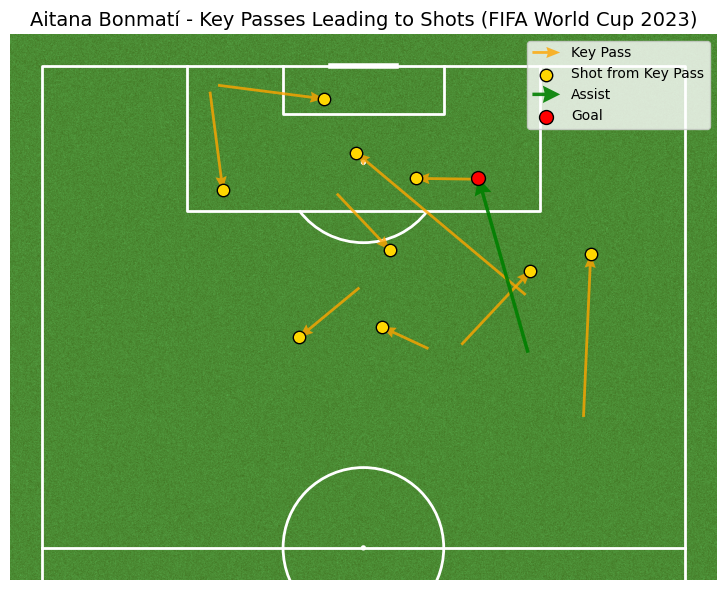

In [26]:
# Filter key passes and assists from Aitana's events
key_passes = aitana_df[(aitana_df['pass_shot_assist'] == True)]
assists = aitana_df[(aitana_df['pass_goal_assist'] == True)]

# Setup pitch
pitch = VerticalPitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', half = True)
fig, ax = pitch.draw(figsize=(8, 6))

# Plot all key passes (orange arrows)
pitch.arrows(key_passes['location'].apply(lambda x: x[0]),
             key_passes['location'].apply(lambda x: x[1]),
             key_passes['pass_end_location'].apply(lambda x: x[0]),
             key_passes['pass_end_location'].apply(lambda x: x[1]),
             ax=ax, color='orange', width=2, headwidth=4, alpha=0.8, label='Key Pass')

# Plot all shot locations (gold scatter from pass_end_location)
pitch.scatter(key_passes['pass_end_location'].apply(lambda x: x[0]),
              key_passes['pass_end_location'].apply(lambda x: x[1]),
              ax=ax, color='gold', edgecolors='black', s=80, label='Shot from Key Pass')

# Plot assists (red arrows)
pitch.arrows(assists['location'].apply(lambda x: x[0]),
             assists['location'].apply(lambda x: x[1]),
             assists['pass_end_location'].apply(lambda x: x[0]),
             assists['pass_end_location'].apply(lambda x: x[1]),
             ax=ax, color='green', width=2.5, headwidth=5, alpha=0.9, label='Assist')

# Plot shot locations for assists (red dots)
pitch.scatter(assists['pass_end_location'].apply(lambda x: x[0]),
              assists['pass_end_location'].apply(lambda x: x[1]),
              ax=ax, color='red', edgecolors='black', s=100, label='Goal')

# 7. Final touches
ax.set_title("Aitana Bonmatí - Key Passes Leading to Shots (FIFA World Cup 2023)", fontsize=14, color='black')
ax.legend(loc='upper right')
plt.show()


Technically, Aitana had 2 assists in the tournament but one of the assists against Switzerland was a shot attempt which  went **wayward**.

#### Passes Into the Penalty Box

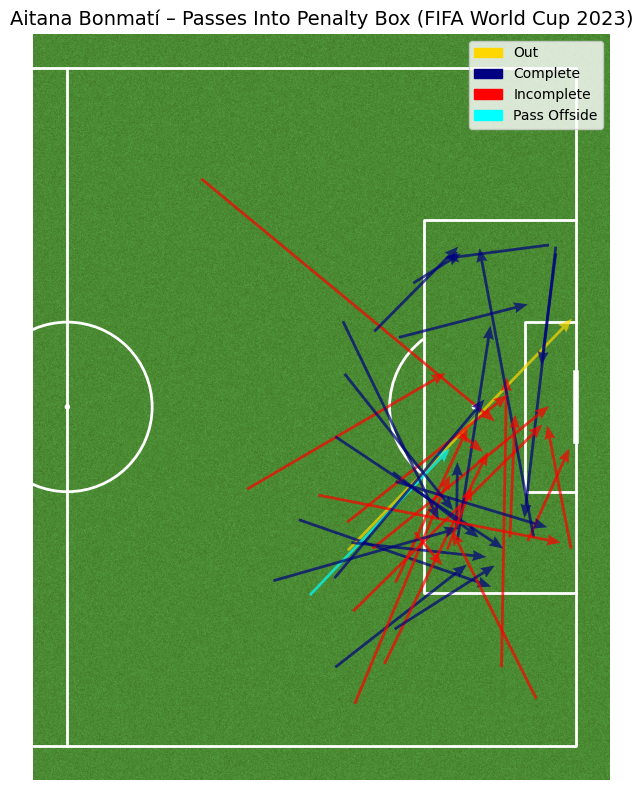

Total Passes into Penalty Box: 39
Breakdown:
outcome
Complete        20
Incomplete      17
Out              1
Pass Offside     1
Name: count, dtype: int64


In [27]:
from mplsoccer import Pitch
import matplotlib.patches as mpatches

# Define penalty box boundaries
def is_inside_box(end_loc):
    return isinstance(end_loc, list) and end_loc[0] >= 102 and 18 <= end_loc[1] <= 62

# Filter passes into the box
passes = aitana_df[aitana_df['type'] == 'Pass']
box_passes = passes[passes['pass_end_location'].apply(is_inside_box)].copy()

# Set outcome as 'Complete' or use original outcome
box_passes['outcome'] = box_passes['pass_outcome'].fillna('Complete')

# Define color mapping
color_map = {
    'Complete': 'navy',
    'Incomplete': 'red',
    'Out': 'gold',
    'Pass Offside': 'cyan'
}

# Setup pitch
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', half = True)
fig, ax = pitch.draw(figsize=(12, 8))

# Plot arrows
for _, row in box_passes.iterrows():
    outcome = row['outcome']
    color = color_map.get(outcome, 'gray')
    pitch.arrows(row['location'][0], row['location'][1],
                 row['pass_end_location'][0], row['pass_end_location'][1],
                 ax=ax, color=color, width=2, headwidth=4, alpha=0.7)

# Create legend patches based on outcomes present
legend_handles = []
for outcome in box_passes['outcome'].unique():
    if outcome in color_map:
        legend_handles.append(mpatches.Patch(color=color_map[outcome], label=outcome))

# Add legend and title
ax.legend(handles=legend_handles, loc='upper right', fontsize=10)
ax.set_title("Aitana Bonmatí – Passes Into Penalty Box (FIFA World Cup 2023)", fontsize=14, color='black')
plt.show()

# Stat count
print(f"Total Passes into Penalty Box: {len(box_passes)}")
print("Breakdown:")
print(box_passes['outcome'].value_counts())


#### Expected Threat (xT)

We will be using the xT grid by David Sumpter from McKaay John's github

Link: https://github.com/mckayjohns/youtube-videos/blob/main/data/xT_Grid.csv

In [28]:
# Load xT Grid
grid_path = 'xT_Grid.csv'
xT_grid = pd.read_csv(grid_path, header=None)
xT = np.array(xT_grid)
xT_rows, xT_cols = xT.shape

In [29]:
# PASSES (successful only)
passes = aitana_df[(aitana_df['type'] == 'Pass') & (aitana_df['pass_outcome'].isna())].copy()
passes['end_location'] = passes['pass_end_location']

# CARRIES (non-null end)
carries = aitana_df[(aitana_df['type'] == 'Carry') & (aitana_df['carry_end_location'].notna())].copy()
carries['end_location'] = carries['carry_end_location']

In [30]:
# Combine & Compute xT
actions = pd.concat([passes, carries], ignore_index=True)
actions = actions[actions['location'].notna() & actions['end_location'].notna()].copy()

# Bin start and end locations
actions['x1_bin'] = pd.cut(actions['location'].apply(lambda x: x[0]), bins=xT_cols, labels=False)
actions['y1_bin'] = pd.cut(actions['location'].apply(lambda x: x[1]), bins=xT_rows, labels=False)
actions['x2_bin'] = pd.cut(actions['end_location'].apply(lambda x: x[0]), bins=xT_cols, labels=False)
actions['y2_bin'] = pd.cut(actions['end_location'].apply(lambda x: x[1]), bins=xT_rows, labels=False)

# Compute xT from grid
actions['start_zone_value'] = actions[['x1_bin','y1_bin']].apply(lambda x: xT[int(x[1]), int(x[0])], axis=1)
actions['end_zone_value'] = actions[['x2_bin','y2_bin']].apply(lambda x: xT[int(x[1]), int(x[0])], axis=1)
actions['xT'] = actions['end_zone_value'] - actions['start_zone_value']

# Print xT summary
print("Aitana Bonmatí generated an xT of", round(float(actions['xT'].sum()), 3), 'in the tournament')


Aitana Bonmatí generated an xT of 0.494 in the tournament


/var/folders/bl/dm6xfp0n2tndy27vk0xjd6jm0000gn/T/ipykernel_1544/186393418.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  actions['start_zone_value'] = actions[['x1_bin','y1_bin']].apply(lambda x: xT[int(x[1]), int(x[0])], axis=1)
/var/folders/bl/dm6xfp0n2tndy27vk0xjd6jm0000gn/T/ipykernel_1544/186393418.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  actions['end_zone_value'] = actions[['x2_bin','y2_bin']].apply(lambda x: xT[int(x[1]), int(x[0])], axis=1)


In [31]:
# Calculating xT per 90
total_xt = actions['xT'].sum()

# Total minutes played
minutes_played = 582  # from FBref

# Compute xT per 90
xt_per_90 = (total_xt / minutes_played) * 90

print(f"Total xT: {total_xt:.3f}")
print(f"Minutes Played: {minutes_played}")
print(f"xT per 90: {xt_per_90:.3f}")


Total xT: 0.494
Minutes Played: 582
xT per 90: 0.076


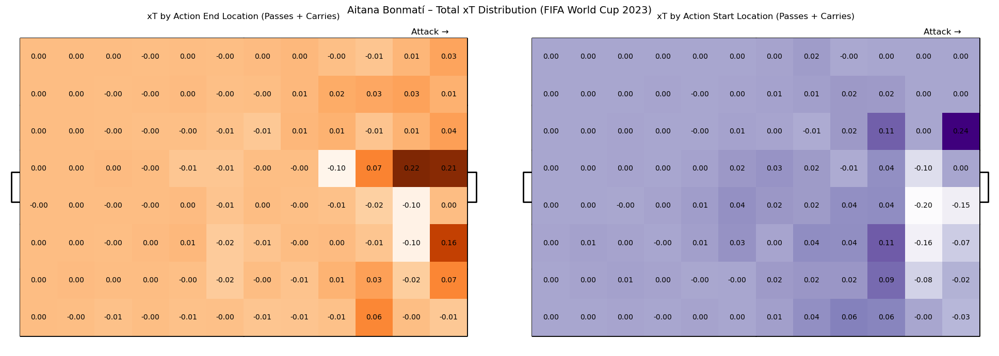

In [32]:
# Setup pitch
pitch = Pitch(pitch_type='statsbomb', pitch_color='white', line_color='black', goal_type='box')
fig, axs = pitch.draw(nrows=1, ncols=2, figsize=(20, 7))

# Coordinates
x_start = actions['location'].apply(lambda x: x[0])
y_start = actions['location'].apply(lambda x: x[1])
x_end = actions['end_location'].apply(lambda x: x[0])
y_end = actions['end_location'].apply(lambda x: x[1])
xt_values = actions['xT']

# END location heatmap
bin_end = pitch.bin_statistic(x_end, y_end, values=xt_values, statistic='sum', bins=(12, 8))
pitch.heatmap(bin_end, ax=axs[0], cmap='Oranges')
pitch.label_heatmap(bin_end, ax=axs[0], color='black', fontsize=10, str_format="{:.2f}")
axs[0].set_title("xT by Action End Location (Passes + Carries)", fontsize=12, color='black')
axs[0].text(105, -1, 'Attack →', color='black', fontsize=12)

# START location heatmap
bin_start = pitch.bin_statistic(x_start, y_start, values=xt_values, statistic='sum', bins=(12, 8))
pitch.heatmap(bin_start, ax=axs[1], cmap='Purples')
pitch.label_heatmap(bin_start, ax=axs[1], color='black', fontsize=10, str_format="{:.2f}")
axs[1].set_title("xT by Action Start Location (Passes + Carries)", fontsize=12, color='black')
axs[1].text(105, -1, 'Attack →', color='black', fontsize=12)

plt.suptitle("Aitana Bonmatí – Total xT Distribution (FIFA World Cup 2023)", fontsize=14, color='black')
plt.tight_layout()
plt.show()

**xT by Action End Location**
- This map shows where Bonmatí's passes and carries ended and how much danger they generated from those locations.

- The darkest orange zones near the right side of the penalty box (especially just outside it) had the highest xT values (e.g., 0.22, 0.21, 0.16).

- This means she frequently delivered or carried the ball into very dangerous areas, enabling shot creation or pre-assist opportunities.

- These areas represent her influence in the final third, especially the right half-space, a known creative zone in modern football.

**xT by Action Start Location**
- This heatmap represents where on the pitch Bonmatí was when she started actions (passes or carries) that eventually led to danger.

- High xT start zones are visible just past midfield and in the right interior channel (values like 0.24, 0.11, 0.09).

- This shows her role as a deep-lying playmaker and central progressor — she created danger not only in the final third but also by initiating build-up earlier in possession.

**xT through passes alone**

In [33]:
passes['x1_bin'] = pd.cut(passes['location'].apply(lambda x: x[0]), bins=xT_cols, labels=False)
passes['y1_bin'] = pd.cut(passes['location'].apply(lambda x: x[1]), bins=xT_rows, labels=False)

passes['x2_bin'] = pd.cut(passes['pass_end_location'].apply(lambda x: x[0]), bins=xT_cols, labels=False)
passes['y2_bin'] = pd.cut(passes['pass_end_location'].apply(lambda x: x[1]), bins=xT_rows, labels=False)

In [34]:
passes['start_zone_value'] = passes[['x1_bin','y1_bin']].apply(lambda x: xT[x[1],x[0]], axis = 1)
passes['end_zone_value'] = passes[['x2_bin','y2_bin']].apply(lambda x: xT[x[1],x[0]], axis = 1)

/var/folders/bl/dm6xfp0n2tndy27vk0xjd6jm0000gn/T/ipykernel_1544/4084735363.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  passes['start_zone_value'] = passes[['x1_bin','y1_bin']].apply(lambda x: xT[x[1],x[0]], axis = 1)
/var/folders/bl/dm6xfp0n2tndy27vk0xjd6jm0000gn/T/ipykernel_1544/4084735363.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  passes['end_zone_value'] = passes[['x2_bin','y2_bin']].apply(lambda x: xT[x[1],x[0]], axis = 1)


In [35]:
passes['xT'] = passes['end_zone_value'] - passes['start_zone_value']

In [36]:
print("Aitana Bonmati had an xT of",round(float(passes.xT.sum()),3), 'in the tournament through passes alone')

Aitana Bonmati had an xT of 0.804 in the tournament through passes alone


This is the **cumulative expected threat** generated by her successful passes during the tournament based on **David Sumpter’s xT model**. What does this mean?

- xT ≈ 0.80 means: Bonmatí's passes increased Spain’s probability of scoring by ~80% over the course of the tournament.

- It captures her ability to move the ball into more dangerous areas that lead to shots or goals.

**PASS END LOCATION xT**

- High xT zones (darker orange) are inside or just outside the penalty area.

- Zones like (final third) had xT scores of 0.24, 0.21, 0.17, indicating strong chance-creation zones.

- This suggests that Bonmatí consistently delivered dangerous passes into tight attacking spaces, especially in central and right channels.

**PASS START LOCATION xT**

- Most threatening starts came from central midfield and advanced right half-spaces.

- Grid cells with xT totals like 0.26, 0.24, and 0.05, 0.06 show she initiated danger from deep midfield into advanced attacking areas.

- This confirms her role as the creative distributor, progressing play from middle zones.


## 3. Attacking Impact

#### Shot Map

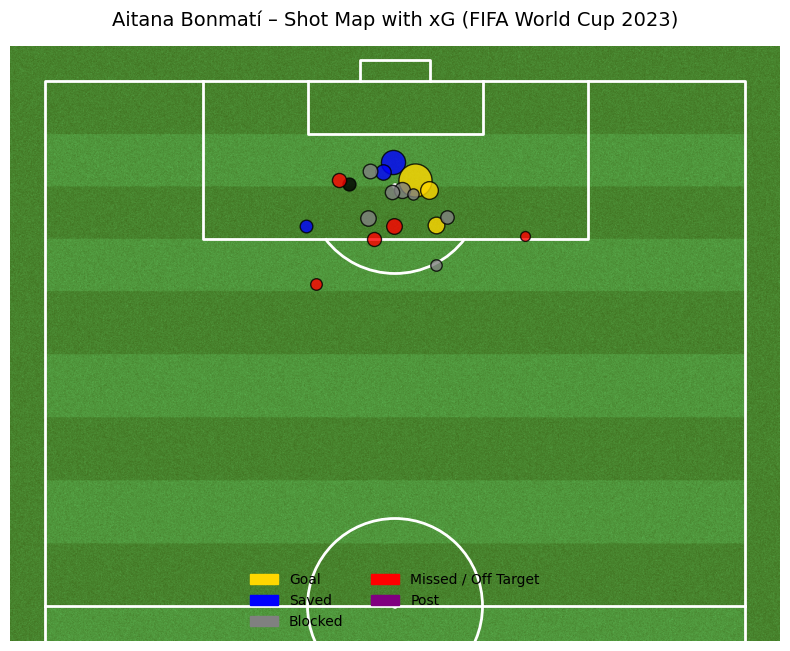

In [37]:
from mplsoccer import VerticalPitch
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Filter Bonmatí's shots
bonmati_shots = aitana_df[(aitana_df['type'] == 'Shot') & (aitana_df['location'].notna())].copy()

# Define outcome colors
color_map = {
    'Goal': 'gold',
    'Saved': 'blue',
    'Blocked': 'gray',
    'Off T': 'red',
    'Post': 'purple',
    'Missed': 'red'
}

# Setup vertical half pitch
pitch = VerticalPitch(
    pitch_type='statsbomb',
    half=True,
    pitch_color='grass',
    line_color='white',
    stripe=True,
    goal_type='box'
)
fig, ax = pitch.draw(figsize=(8, 10))

# Plot shots with xG-scaled bubbles
for _, row in bonmati_shots.iterrows():
    x, y = row['location']
    xg = row.get('shot_statsbomb_xg', 0)
    outcome = row.get('shot_outcome', 'Other')
    color = color_map.get(outcome, 'black')
    pitch.scatter(
        x, y, s=xg * 1500, color=color,
        edgecolors='black', alpha=0.8, ax=ax, zorder=3
    )

# Legend
legend_patches = [
    mpatches.Patch(color='gold', label='Goal'),
    mpatches.Patch(color='blue', label='Saved'),
    mpatches.Patch(color='gray', label='Blocked'),
    mpatches.Patch(color='red', label='Missed / Off Target'),
    mpatches.Patch(color='purple', label='Post'),
]
ax.legend(handles=legend_patches, loc='lower center', fontsize=10, frameon=False, ncol=2)

# Title
ax.set_title("Aitana Bonmatí – Shot Map with xG (FIFA World Cup 2023)", fontsize=14, color='black', pad=15)
plt.tight_layout()
plt.show()


#### Custom xG Model

In [38]:
# Extracting Event Data for all matches
all_events = []

for match_id in matches['match_id']:
  events = sb.events(match_id=match_id).reset_index(drop=True)
  all_events.append(events)  # appending all spain events to empty list

df = pd.concat(all_events).reset_index(drop = True)

In [39]:
shots_df = df[df['type']=='Shot']

In [40]:
shots_df.head()

,50_50,bad_behaviour_card,ball_receipt_outcome,ball_recovery_recovery_failure,block_deflection,carry_end_location,clearance_aerial_won,clearance_body_part,clearance_head,clearance_left_foot,...,goalkeeper_success_in_play,shot_saved_off_target,goalkeeper_punched_out,block_save_block,goalkeeper_penalty_saved_to_post,dribble_no_touch,goalkeeper_success_out,shot_follows_dribble,player_off_permanent,shot_redirect
3072,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3073,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3074,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3075,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3076,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [41]:
features = ['shot_body_part', 'shot_end_location','shot_first_time','shot_one_on_one', 'shot_outcome','shot_technique', 'shot_type', 'location', 'play_pattern', 'under_pressure']

In [42]:
# database for xG model
xG_df = shots_df[features]

# We will use location and shot_end location to calculate shot_distance and shot_angle
GOAL_WIDTH = 7.32

# Drop rows with missing locations
xG_df = xG_df[xG_df['location'].notna() & xG_df['shot_end_location'].notna()].copy()


# Extract coordinates
xG_df['x'] = xG_df['location'].apply(lambda x: x[0])
xG_df['y'] = xG_df['location'].apply(lambda x: x[1])
xG_df['end_x'] = xG_df['shot_end_location'].apply(lambda x: x[0])
xG_df['end_y'] = xG_df['shot_end_location'].apply(lambda x: x[1])


# Distance between shot and goal center (can use end_x, end_y or fixed goal location)
xG_df['distance'] = np.sqrt((xG_df['end_x'] - xG_df['x'])**2 + (xG_df['end_y'] - xG_df['y'])**2)


# Triangle-based angle calculation
def calculate_angle(row):
    x, y = row['x'], row['y']
    end_x, end_y = row['end_x'], row['end_y']
    dx = end_x - x
    dy1 = end_y - GOAL_WIDTH / 2 - y
    dy2 = end_y + GOAL_WIDTH / 2 - y
    angle = abs(np.arctan2(dy2, dx) - np.arctan2(dy1, dx))
    return angle

# Apply fixed function
xG_df['shot_angle'] = xG_df.apply(calculate_angle, axis=1)

xG_df=xG_df.drop(columns=['location','shot_end_location','x','y','end_x','end_y'])

In [43]:
xG_df.head()

,shot_body_part,shot_first_time,shot_one_on_one,shot_outcome,shot_technique,shot_type,play_pattern,under_pressure,distance,shot_angle
3072,Right Foot,True,NaN,Saved,Half Volley,Open Play,From Free Kick,True,7.746612,0.755646
3073,Head,NaN,NaN,Blocked,Normal,Open Play,From Corner,True,0.424264,2.976930
3074,Head,NaN,NaN,Blocked,Normal,Open Play,From Corner,NaN,4.123106,1.418117
3075,Left Foot,True,NaN,Blocked,Volley,Open Play,From Corner,NaN,2.441311,2.040741
3076,Head,NaN,NaN,Off T,Normal,Open Play,From Corner,NaN,8.000625,0.858049


In [44]:
xG_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1680 entries, 3072 to 226010
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   shot_body_part   1680 non-null   object 
 1   shot_first_time  531 non-null    object 
 2   shot_one_on_one  81 non-null     object 
 3   shot_outcome     1680 non-null   object 
 4   shot_technique   1680 non-null   object 
 5   shot_type        1680 non-null   object 
 6   play_pattern     1680 non-null   object 
 7   under_pressure   664 non-null    object 
 8   distance         1680 non-null   float64
 9   shot_angle       1680 non-null   float64
dtypes: float64(2), object(8)
memory usage: 144.4+ KB


In [45]:
xG_df.under_pressure.unique()

array([True, nan], dtype=object)

In [46]:
from sklearn.preprocessing import OneHotEncoder

# Columns to Encode
categorical_cols = ['shot_body_part','shot_technique', 'shot_type', 'play_pattern']

# Correct way to get only available boolean columns
bool_cols = [col for col in ['under_pressure','shot_first_time','shot_one_on_one'] if col in xG_df.columns]

# Fill missing boolean values
xG_df[bool_cols] = xG_df[bool_cols].fillna(False).astype(bool)

# Fill missing values
xG_df[categorical_cols] = xG_df[categorical_cols].fillna('Unknown')

# One-hot encode and concatenate
xG_df_encoded = pd.get_dummies(xG_df, columns=categorical_cols, drop_first=True)

# Encode target column (is goal)
xG_df_encoded['is_goal'] = xG_df_encoded['shot_outcome'].apply(lambda x: 1 if x == 'Goal' else 0)

# Drop columns we don't need for training
xG_df_encoded = xG_df_encoded.drop(columns=['shot_outcome'])

/var/folders/bl/dm6xfp0n2tndy27vk0xjd6jm0000gn/T/ipykernel_1544/1437985842.py:10: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  xG_df[bool_cols] = xG_df[bool_cols].fillna(False).astype(bool)


In [47]:
xG_df_encoded.head()

,shot_first_time,shot_one_on_one,under_pressure,distance,shot_angle,shot_body_part_Left Foot,shot_body_part_Other,shot_body_part_Right Foot,shot_technique_Diving Header,shot_technique_Half Volley,...,shot_type_Penalty,play_pattern_From Counter,play_pattern_From Free Kick,play_pattern_From Goal Kick,play_pattern_From Keeper,play_pattern_From Kick Off,play_pattern_From Throw In,play_pattern_Other,play_pattern_Regular Play,is_goal
3072,True,False,True,7.746612,0.755646,False,False,True,False,True,...,False,False,True,False,False,False,False,False,False,0
3073,False,False,True,0.424264,2.976930,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,0
3074,False,False,False,4.123106,1.418117,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,0
3075,True,False,False,2.441311,2.040741,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,0
3076,False,False,False,8.000625,0.858049,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,0


In [48]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, classification_report, confusion_matrix

# Features and target
y = xG_df_encoded['is_goal']
X = xG_df_encoded.drop(columns=['is_goal'])

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

# Train Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, max_depth=6, random_state=42)
rf_model.fit(X_train, y_train)

# Predictions
y_pred_proba = rf_model.predict_proba(X_test)[:, 1]
y_pred_class = rf_model.predict(X_test)

# Evaluation
print("AUC Score:", roc_auc_score(y_test, y_pred_proba))
print("\nClassification Report:\n", classification_report(y_test, y_pred_class))
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_class))

AUC Score: 0.7516948386513603

Classification Report:
               precision    recall  f1-score   support

           0       0.92      1.00      0.96       299
           1       1.00      0.27      0.43        37

    accuracy                           0.92       336
   macro avg       0.96      0.64      0.69       336
weighted avg       0.93      0.92      0.90       336


Confusion Matrix:
 [[299   0]
 [ 27  10]]


In [49]:
# Predict xG for Aitana Bonmati's shots

# Feature engineering (distance and angle)
bonmati_shots['x'] = bonmati_shots['location'].apply(lambda x: x[0])
bonmati_shots['y'] = bonmati_shots['location'].apply(lambda x: x[1])
bonmati_shots['end_x'] = bonmati_shots['shot_end_location'].apply(lambda x: x[0])
bonmati_shots['end_y'] = bonmati_shots['shot_end_location'].apply(lambda x: x[1])

bonmati_shots['distance'] = np.sqrt((bonmati_shots['end_x'] - bonmati_shots['x'])**2 + (bonmati_shots['end_y'] - bonmati_shots['y'])**2)

bonmati_shots['shot_angle'] = bonmati_shots.apply(calculate_angle, axis=1)

# Prepare same categorical & boolean features
for col in ['shot_body_part', 'shot_technique', 'shot_type', 'play_pattern']:
    bonmati_shots[col] = bonmati_shots[col].fillna('Unknown')

for col in ['under_pressure','shot_first_time','shot_one_on_one']:
    if col in bonmati_shots.columns:
        bonmati_shots[col] = bonmati_shots[col].fillna(False).astype(bool)

# One-hot encoding to match model
bonmati_encoded = pd.get_dummies(bonmati_shots, columns=categorical_cols, drop_first=True)

# Align with model's training features
bonmati_encoded = bonmati_encoded.reindex(columns=X.columns, fill_value=0)

# Predict xG
bonmati_shots['predicted_xG'] = rf_model.predict_proba(bonmati_encoded)[:, 1]

# Summary stats
total_xG = bonmati_shots['predicted_xG'].sum()
xG_per_90 = total_xG / (minutes_played / 90)

print(f"Total xG: {total_xG:.3f}")
print(f"xG per 90 minutes: {xG_per_90:.3f}")

Total xG: 3.410
xG per 90 minutes: 0.527


/var/folders/bl/dm6xfp0n2tndy27vk0xjd6jm0000gn/T/ipykernel_1544/2873948806.py:19: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  bonmati_shots[col] = bonmati_shots[col].fillna(False).astype(bool)
/var/folders/bl/dm6xfp0n2tndy27vk0xjd6jm0000gn/T/ipykernel_1544/2873948806.py:19: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  bonmati_shots[col] = bonmati_shots[col].fillna(False).astype(bool)
/var/folders/bl/dm6xfp0n2tndy27vk0xjd6jm0000gn/T/ipykernel_1544/2873948806.py:19: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated 

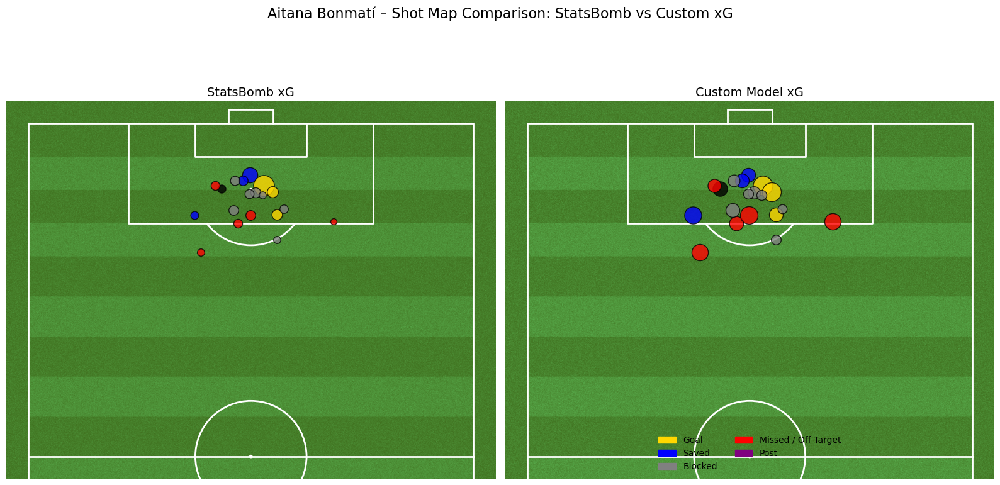

In [50]:
# Set up side-by-side subplots
pitch = VerticalPitch(
    pitch_type='statsbomb',
    half=True,
    pitch_color='grass',
    line_color='white',
    stripe=True,
    goal_type='box'
)
fig, axes = pitch.draw(ncols=2, figsize=(16, 9))

# Outcome colors
color_map = {
    'Goal': 'gold',
    'Saved': 'blue',
    'Blocked': 'gray',
    'Off T': 'red',
    'Post': 'purple',
    'Missed': 'red'
}

# === Left: StatsBomb xG ===
for _, row in bonmati_shots.iterrows():
    x, y = row['location']
    xg = row.get('shot_statsbomb_xg', 0)
    outcome = row.get('shot_outcome', 'Other')
    color = color_map.get(outcome, 'black')
    pitch.scatter(
        x, y, s=xg * 1500, color=color,
        edgecolors='black', alpha=0.8, ax=axes[0], zorder=3
    )
axes[0].set_title("StatsBomb xG", fontsize=14, color='black')

# === Right: Custom Model xG ===
for _, row in bonmati_shots.iterrows():
    x, y = row['location']
    xg = row.get('predicted_xG', 0)
    outcome = row.get('shot_outcome', 'Other')
    color = color_map.get(outcome, 'black')
    pitch.scatter(
        x, y, s=xg * 1500, color=color,
        edgecolors='black', alpha=0.8, ax=axes[1], zorder=3
    )
axes[1].set_title("Custom Model xG", fontsize=14, color='black')

# === Shared Legend ===
legend_patches = [
    mpatches.Patch(color='gold', label='Goal'),
    mpatches.Patch(color='blue', label='Saved'),
    mpatches.Patch(color='gray', label='Blocked'),
    mpatches.Patch(color='red', label='Missed / Off Target'),
    mpatches.Patch(color='purple', label='Post'),
]
axes[1].legend(handles=legend_patches, loc='lower center', fontsize=10, frameon=False, ncol=2)

plt.suptitle("Aitana Bonmatí – Shot Map Comparison: StatsBomb vs Custom xG", fontsize=16, color='black')
plt.tight_layout()
plt.show()


####xG Chain  & xGBuildup for Bonmati

In [51]:
# Step 1: Get all shot possessions and their xG
shot_events = spain_df[(spain_df['type'] == 'Shot') & (spain_df['possession'].notna())]
possession_xg = dict(zip(shot_events['possession'], shot_events['shot_statsbomb_xg']))

# Step 2: Track xGChain and xGBuildup for Aitana
xg_chain = 0
xg_buildup = 0
involved_possessions = set()
buildup_possessions = set()

for possession_id, group in spain_df.groupby('possession'):
    group = group.copy()
    players_involved = group['player'].dropna().unique()

    if 'Aitana Bonmati Conca' in players_involved:
        xg_val = possession_xg.get(possession_id, 0)
        xg_chain += xg_val
        involved_possessions.add(possession_id)

        # Check whether she made the shot or goal-assist in this possession
        aitana_events = group[group['player'] == 'Aitana Bonmati Conca']
        shot_involved = (aitana_events['type'] == 'Shot').any()
        assisted_goal = (aitana_events['pass_goal_assist'] == True).any() if 'pass_goal_assist' in aitana_events.columns else False

        if not shot_involved and not assisted_goal:
            xg_buildup += xg_val
            buildup_possessions.add(possession_id)


In [52]:
print(f"Aitana Bonmatí xGChain: {xg_chain:.3f}")
print(f"Aitana Bonmatí xGBuildup: {xg_buildup:.3f}")
print(f"Possessions Involved: {len(involved_possessions)}")
print(f"Buildup Only Possessions: {len(buildup_possessions)}")

Aitana Bonmatí xGChain: 9.905
Aitana Bonmatí xGBuildup: 8.153
Possessions Involved: 167
Buildup Only Possessions: 149


In [53]:
# Goals
goals = aitana_df[(aitana_df['type'] == 'Shot') & (aitana_df['shot_outcome'] == 'Goal')].shape[0]

# Assists (pass_goal_assist == True)
assists = aitana_df[aitana_df.get('pass_goal_assist') == True].shape[0] if 'pass_goal_assist' in aitana_df.columns else 0

# Shots
shots = aitana_df[aitana_df['type'] == 'Shot'].shape[0]

# Total xG from StatsBomb
total_xg = aitana_df['shot_statsbomb_xg'].sum()

# Shots per 90
shots_per_90 = (shots / minutes_played) * 90
xg_per_90 = (total_xg / minutes_played) * 90

# Assume Spain team goals from Spain matches dataset
team_goals = spain_df[(spain_df['team'] == 'Spain') & (spain_df['type'] == 'Shot') & (spain_df['shot_outcome'] == 'Goal')].shape[0]
goal_contribution_pct = ((goals + assists) / team_goals) * 100 if team_goals else 0

# Print results
print(f"Goals: {goals}")
print(f"Assists: {assists}")
print(f"Shots per 90: {shots_per_90:.2f}")
print(f"xG per 90: {xg_per_90:.2f}")
print(f"Goal Contribution: {goal_contribution_pct:.1f}%")


Goals: 3
Assists: 1
Shots per 90: 2.94
xG per 90: 0.27
Goal Contribution: 0.0%


## 4. Defensive Intelligence

#### Defensive Actions Map

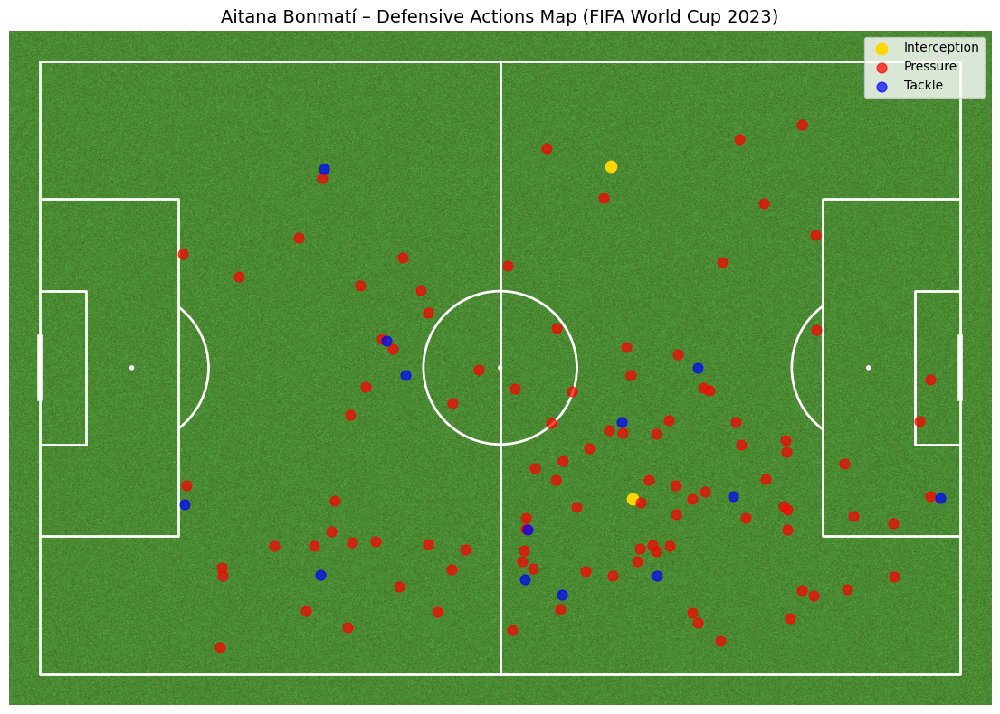

In [54]:
# Filter relevant defensive events
interceptions = aitana_df[aitana_df['type'] == 'Interception']
pressures = aitana_df[(aitana_df['type'] == 'Pressure') & (aitana_df['location'].notna())]
tackles = aitana_df[(aitana_df['duel_type'] == 'Tackle') & (aitana_df['location'].notna())]

# Set up pitch
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
fig, ax = pitch.draw(figsize=(12, 8))

# Plot events
pitch.scatter(interceptions['location'].apply(lambda x: x[0]),
              interceptions['location'].apply(lambda x: x[1]),
              ax=ax, color='gold', label='Interception', s=80)

pitch.scatter(pressures['location'].apply(lambda x: x[0]),
              pressures['location'].apply(lambda x: x[1]),
              ax=ax, color='red', label='Pressure', s=60, alpha=0.7)

pitch.scatter(tackles['location'].apply(lambda x: x[0]),
              tackles['location'].apply(lambda x: x[1]),
              ax=ax, color='blue', label='Tackle', s=60, alpha=0.7)

# Legend and title
ax.legend(loc='upper right', fontsize=10)
ax.set_title("Aitana Bonmatí – Defensive Actions Map (FIFA World Cup 2023)", fontsize=14, color='black')
plt.show()


#### Pressure Heat Map

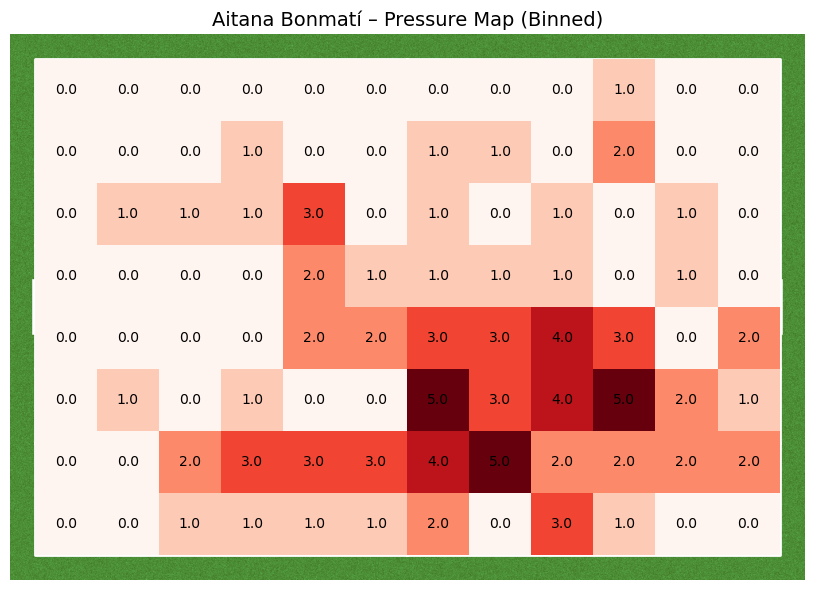

In [55]:
# Filter pressure events with valid locations
pressures = aitana_df[(aitana_df['type'] == 'Pressure') & (aitana_df['location'].notna())].copy()
pressures[['x', 'y']] = pressures['location'].apply(pd.Series)

# Plot pressure heatmap
pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white')
bin_stat = pitch.bin_statistic(pressures['x'], pressures['y'], statistic='count', bins=(12, 8))
fig, ax = pitch.draw(figsize=(10, 6))
pitch.heatmap(bin_stat, ax=ax, cmap='Reds')
pitch.label_heatmap(bin_stat, ax=ax, color='black', fontsize=10)
ax.set_title("Aitana Bonmatí – Pressure Map (Binned)", fontsize=14, color='black')
plt.show()


#### Stats

In [56]:
# --- Duels ---
duels = aitana_df[aitana_df['type'] == 'Duel']
duels_won = duels[duels['duel_outcome'] == 'Won']
duel_win_pct = (len(duels_won) / len(duels)) * 100 if len(duels) else 0

# --- Tackles ---
tackles = aitana_df[aitana_df['duel_type'] == 'Tackle']
tackles_won = tackles[tackles['duel_outcome'].isin(['Won', None])]
tackle_success_pct = (len(tackles_won) / len(tackles)) * 100 if len(tackles) else 0

# --- Pressures per 90 ---
pressures = aitana_df[aitana_df['type'] == 'Pressure']
pressures_per_90 = (len(pressures) / minutes_played) * 90 if minutes_played else 0

# --- Print results ---
print("Defensive Stats Summary:")
print(f"• Duel Win %:            {duel_win_pct:.1f}%")
print(f"• Successful Tackles %:  {tackle_success_pct:.1f}%")
print(f"• Pressures per 90:      {pressures_per_90:.2f}")


Defensive Stats Summary:
• Duel Win %:            29.4%
• Successful Tackles %:  38.5%
• Pressures per 90:      15.62
